#                            DECISION TREE ON DONORS DATA SET

## IMPORTING LIBRARIES

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import math as m
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import Normalizer
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from tqdm import tqdm

import nltk
nltk.downloader.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid= SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


## IMPORTING DATASET

In [2]:
from google.colab import files
uploaded = files.upload()

Saving preprocessed_data.csv to preprocessed_data.csv


In [3]:
data=pd.read_csv('preprocessed_data.csv')

In [4]:
data.head(5)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03
2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00
3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04
4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74


In [5]:
negative=[]
positive=[]
neutral=[]
compound=[]

def update_sentiments(values):
    negative.append(values["neg"])
    positive.append(values["pos"])
    neutral.append(values["neu"])
    compound.append(values["compound"])

In [6]:
for essay in tqdm(data["essay"]):
    update_sentiments(sid.polarity_scores(essay))

100%|██████████| 109248/109248 [03:54<00:00, 466.25it/s]


In [7]:
data["neg"]=negative
data["pos"]=positive
data["neu"]=neutral
data["compound"]=compound

In [8]:
data.head(5)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,0.013,0.205,0.783,0.9867
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,0.072,0.248,0.680,0.9897
2,ca,mrs,grades_prek_2,10,1,literacy_language,literacy,having class 24 students comes diverse learner...,329.00,0.017,0.262,0.721,0.9860
3,ga,mrs,grades_prek_2,2,1,appliedlearning,earlydevelopment,i recently read article giving students choice...,481.04,0.030,0.187,0.783,0.9524
4,wa,mrs,grades_3_5,2,1,literacy_language,literacy,my students crave challenge eat obstacles brea...,17.74,0.029,0.288,0.683,0.9873


## SPLITTING DATA INTO TRAIN AND CROSS VALIDATION(OR TEST): STRATIFIED SAMPLING

In [9]:
y=data["project_is_approved"].values
X=data.drop(["project_is_approved"],axis=1)

In [10]:
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.33, stratify=y, random_state=42)

In [11]:
print("Total data points in Train Dataset =",len(y_train))
print("Total data points in Test Dataset =",len(y_test))

Total data points in Train Dataset = 73196
Total data points in Test Dataset = 36052


## MAKE DATA MODEL READY: ENCODING ESSAY(TEST FEATURE)

### TFIDF VECTORIZER

In [12]:
tfidfvectorizer=TfidfVectorizer(min_df=10,max_features=5000)
text_tfidf=tfidfvectorizer.fit(X_train["essay"].values)

print("Before vectorizations")
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
print("*"*50)

X_train_essay_tfidf=tfidfvectorizer.transform(X_train["essay"].values)
X_test_essay_tfidf=tfidfvectorizer.transform(X_test["essay"].values)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_test_essay_tfidf.shape, y_test.shape)

Before vectorizations
(73196, 12) (73196,)
(36052, 12) (36052,)
**************************************************
After vectorizations
(73196, 5000) (73196,)
(36052, 5000) (36052,)


### TFIDF W2V

In [20]:
from google.colab import files
uploaded = files.upload()

Saving glove_vectors to glove_vectors


In [21]:
import pickle
with open(r'glove_vectors',"rb") as f:
    model=pickle.load(f)
    glove_words=set(model.keys())

In [22]:
tfidf_model=TfidfVectorizer()
tfidf_model.fit(X_train["essay"])
dictionary=dict(zip(tfidf_model.get_feature_names(),list(tfidf_model.idf_)))
tfidf_words=set(tfidf_model.get_feature_names())

#### TFIDF W2V FOR TRAIN DATASET

In [23]:
X_train_tfidf_w2v=[]
for sentence in tqdm(X_train["essay"]):
    vector=np.zeros(300)
    tf_idf_weight=0;
    for word in sentence.split():
        if(word in glove_words) and (word in tfidf_words):
            vec=model[word]
            tf_idf=dictionary[word]*(sentence.count(word)/len(sentence.split()))
            tf_idf_weight+= tf_idf
    if tf_idf_weight !=0:
        vector/=tf_idf_weight
    X_train_tfidf_w2v.append(vector)
X_train_tfidf_w2v=np.array(X_train_tfidf_w2v)

print("After Vectorization")
print(X_train_tfidf_w2v.shape, y_train.shape)

100%|██████████| 73196/73196 [02:02<00:00, 599.44it/s]


After Vectorization
(73196, 300) (73196,)


####  TFIDF W2V FOR TEST DATASET

In [24]:
X_test_tfidf_w2v=[]
for sentence in tqdm(X_test["essay"]):
    vector=np.zeros(300)
    tf_idf_weight=0;
    for word in sentence.split():
        if(word in glove_words) and (word in tfidf_words):
            vec=model[word]
            tf_idf=dictionary[word]*(sentence.count(word)/len(sentence.split()))
            tf_idf_weight+=tf_idf
    if tf_idf_weight !=0:
        vector/=tf_idf_weight
    X_test_tfidf_w2v.append(vector)
X_test_tfidf_w2v=np.array(X_test_tfidf_w2v)

print("After Vectorization")
print(X_test_tfidf_w2v.shape, y_train.shape)

100%|██████████| 36052/36052 [01:00<00:00, 597.61it/s]


After Vectorization
(36052, 300) (73196,)


## MAKE DATA MODEL READY: CATEGORICAL FEATURES.

#### ENCODING CATEGORICAL FEATURES: SCHOOL STATE

In [25]:
vectorizer_state=CountVectorizer()
vectorizer_state.fit(X_train["school_state"].values)

X_train_school_state_one= vectorizer_state.transform(X_train["school_state"].values)
X_test_school_state_one= vectorizer_state.transform(X_test["school_state"].values)

print("After vectorization")
print(X_train_school_state_one.shape,y_train.shape)
print(X_test_school_state_one.shape, y_test.shape)

After vectorization
(73196, 51) (73196,)
(36052, 51) (36052,)


#### ENCODING CATEGORICAL FEATURES: TEACHER_PREFIX

In [26]:
vectorizer_prefix=CountVectorizer()
vectorizer_prefix.fit(X_train["teacher_prefix"].values)

X_train_teacher_prefix_one=vectorizer_prefix.transform(X_train["teacher_prefix"].values)
X_test_teacher_prefix_one=vectorizer_prefix.transform(X_test["teacher_prefix"].values)

print("After vectorization")
print(X_train_teacher_prefix_one.shape, y_train.shape)
print(X_test_teacher_prefix_one.shape, y_test.shape)

After vectorization
(73196, 5) (73196,)
(36052, 5) (36052,)


#### ENCODING CATEGORICAL FEATURES: PROJECT_GRADE_CATEGORY

In [27]:
vectorizer_grade=CountVectorizer()
vectorizer_grade.fit(X_train["project_grade_category"].values)

X_train_project_grade_category_one=vectorizer_grade.transform(X_train["project_grade_category"].values)
X_test_project_grade_category_one=vectorizer_grade.transform(X_test["project_grade_category"].values)

print("After vectorization")
print(X_train_project_grade_category_one.shape, y_train.shape)
print(X_test_project_grade_category_one.shape, y_test.shape)

After vectorization
(73196, 4) (73196,)
(36052, 4) (36052,)


#### ENCODING CATEGORICAL FEATURES: CLEAN_CATEGORIES

In [28]:
vectorizer_category=CountVectorizer()
vectorizer_category.fit(X_train["clean_categories"].values)

X_train_clean_category_one=vectorizer_category.transform(X_train["clean_categories"].values)
X_test_clean_category_one=vectorizer_category.transform(X_test["clean_categories"].values)

print("After vectorization")
print(X_train_clean_category_one.shape, y_train.shape)
print(X_test_clean_category_one.shape, y_test.shape)

After vectorization
(73196, 9) (73196,)
(36052, 9) (36052,)


#### ENCODING CATEGORICAL FEATURES: CLEAN_SUBCATEGORIES

In [29]:
vectorizer_subcategory=CountVectorizer()
vectorizer_subcategory.fit(X_train["clean_subcategories"].values)

X_train_clean_subcategory_one=vectorizer_subcategory.transform(X_train["clean_subcategories"].values)
X_test_clean_subcategory_one=vectorizer_subcategory.transform(X_test["clean_subcategories"].values)

print("After vectorization")
print(X_train_clean_subcategory_one.shape, y_train.shape)
print(X_test_clean_subcategory_one.shape, y_test.shape)

After vectorization
(73196, 30) (73196,)
(36052, 30) (36052,)


## ENCODING NUMERICAL FEATURES

#### ENCODING NUMERICAL FEATURES: PRICE

In [30]:
normalizer=Normalizer()
normalizer.fit(X_train["price"].values.reshape(1,-1))

X_train_price_norm=normalizer.transform(X_train["price"].values.reshape(1,-1))
X_test_price_norm=normalizer.transform(X_test["price"].values.reshape(1,-1))

X_train_price_norm=X_train_price_norm.reshape(-1,1)
X_test_price_norm=X_test_price_norm.reshape(-1,1)

print("After vectorization")
print(X_train_price_norm.shape, y_train.shape)
print(X_test_price_norm.shape, y_test.shape)

After vectorization
(73196, 1) (73196,)
(36052, 1) (36052,)


#### ENCODING NUMERICAL FEATURES: TEACHER_NUMBER_OF_PREVIOUSLY_POSTED_PROJECTS

In [31]:
normalizer=Normalizer()
normalizer.fit(X_train["teacher_number_of_previously_posted_projects"].values.reshape(1,-1))

X_train_submission_norm = normalizer.transform(X_train["teacher_number_of_previously_posted_projects"].values.reshape(1,-1))
X_test_submission_norm= normalizer.transform(X_test["teacher_number_of_previously_posted_projects"].values.reshape(1,-1))

X_train_submission_norm=X_train_submission_norm.reshape(-1,1)
X_test_submission_norm=X_test_submission_norm.reshape(-1,1)

print("After vectorization")
print(X_train_submission_norm.shape, y_train.shape)
print(X_test_submission_norm.shape, y_test.shape)

After vectorization
(73196, 1) (73196,)
(36052, 1) (36052,)


#### ENCODING NUMERICAL FEATURES: NEG

In [32]:
normalizer=Normalizer()
normalizer.fit(X_train["neg"].values.reshape(1,-1))

X_train_neg_norm=normalizer.transform(X_train["neg"].values.reshape(1,-1))
X_test_neg_norm=normalizer.transform(X_test["neg"].values.reshape(1,-1))

X_train_neg_norm=X_train_neg_norm.reshape(-1,1)
X_test_neg_norm=X_test_neg_norm.reshape(-1,1)

print("After vectorization")
print(X_train_neg_norm.shape, y_train.shape)
print(X_test_neg_norm.shape, y_test.shape)

After vectorization
(73196, 1) (73196,)
(36052, 1) (36052,)


#### ENCODING NUMERICAL FEATURES: POS

In [33]:
normalizer=Normalizer()
normalizer.fit(X_train["pos"].values.reshape(1,-1))

X_train_pos_norm=normalizer.transform(X_train["pos"].values.reshape(1,-1))
X_test_pos_norm=normalizer.transform(X_test["pos"].values.reshape(1,-1))

X_train_pos_norm =X_train_pos_norm .reshape(-1,1)
X_test_pos_norm=X_test_neg_norm.reshape(-1,1)

print("After vectorization")
print(X_train_pos_norm.shape, y_train.shape)
print(X_test_pos_norm.shape, y_test.shape)

After vectorization
(73196, 1) (73196,)
(36052, 1) (36052,)


#### ENCODING NUMERICAL FEATURES: neu

In [34]:
normalizer= Normalizer()
normalizer.fit(X_train["neu"].values.reshape(1,-1))

X_train_neu_norm=normalizer.transform(X_train["neu"].values.reshape(1,-1))
X_test_neu_norm=normalizer.transform(X_test["neu"].values.reshape(1,-1))

X_train_neu_norm=X_train_neu_norm.reshape(-1,1)
X_test_neu_norm=X_test_neu_norm.reshape(-1,1)

print("After Vectorization")
print(X_train_neu_norm.shape, y_train.shape)
print(X_test_neu_norm.shape, y_test.shape)

After Vectorization
(73196, 1) (73196,)
(36052, 1) (36052,)


#### ENCODING NUMERICAL FEATURES: COMPOUND

In [35]:
normalizer=Normalizer()
normalizer.fit(X_train["compound"].values.reshape(1,-1))

X_train_compound_norm=normalizer.transform(X_train["compound"].values.reshape(1,-1))
X_test_compound_norm=normalizer.transform(X_test["compound"].values.reshape(1,-1))

X_train_compound_norm=X_train_compound_norm.reshape(-1,1)
X_test_compound_norm=X_test_compound_norm.reshape(-1,1)

print("After Vectrorization")
print(X_train_compound_norm.shape, y_train.shape)
print(X_test_compound_norm.shape, y_train.shape)

After Vectrorization
(73196, 1) (73196,)
(36052, 1) (73196,)


# CONCATINATING ALL THE FEATURES

### SET-1

#### SET-1: CATEGORICAL, NUMERICAL FEATURES+PREPROCESSED_ESSAY(TFIDF)

In [36]:
from scipy.sparse import hstack
X_train_set_one=hstack((X_train_essay_tfidf, X_train_school_state_one, X_train_teacher_prefix_one, X_train_project_grade_category_one, X_train_clean_category_one, X_train_clean_subcategory_one, X_train_price_norm, X_train_submission_norm, X_train_neg_norm, X_train_pos_norm, X_train_neu_norm, X_train_compound_norm)).tocsr()
X_test_set_one=hstack((X_test_essay_tfidf, X_test_school_state_one, X_test_teacher_prefix_one, X_test_project_grade_category_one, X_test_clean_category_one, X_test_clean_subcategory_one, X_test_price_norm, X_test_submission_norm, X_test_neg_norm, X_test_pos_norm, X_test_neu_norm, X_test_compound_norm)).tocsr()

In [37]:
print("Shape of train and test After Stacking")
print(X_train_set_one.shape)
print(X_test_set_one.shape)

Shape of train and test After Stacking
(73196, 5105)
(36052, 5105)


### SET-2

#### SET-2: CATEGORICAL, NUMERICAL FEATURES+PREPROCESSED_ESSAY(TFIDF W2V)

In [38]:
from scipy.sparse import hstack
X_train_set_two=hstack((X_train_tfidf_w2v, X_train_school_state_one, X_train_teacher_prefix_one, X_train_project_grade_category_one, X_train_clean_category_one, X_train_clean_subcategory_one, X_train_price_norm, X_train_submission_norm, X_train_neg_norm, X_train_pos_norm, X_train_neu_norm, X_train_compound_norm)).tocsr()
X_test_set_two=hstack((X_test_tfidf_w2v, X_test_school_state_one, X_test_teacher_prefix_one, X_test_project_grade_category_one, X_test_clean_category_one, X_test_clean_subcategory_one, X_test_price_norm, X_test_submission_norm, X_test_neg_norm, X_test_pos_norm, X_test_neu_norm, X_test_compound_norm)).tocsr()

In [39]:
print("Shape of train and test After Stacking")
print(X_train_set_two.shape)
print(X_test_set_two.shape)

Shape of train and test After Stacking
(73196, 405)
(36052, 405)


#                                                         TASK -1

## DECISION TREE USING GRID SEARCH CROSS VALIDATION(SET-1) 

In [43]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_train_set_one,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'ma

In [44]:
train_auc=clf.cv_results_["mean_train_score"]
train_auc_std= clf.cv_results_['std_train_score']
cv_auc=clf.cv_results_["mean_test_score"]
cv_auc_std=clf.cv_results_["std_test_score"]

In [45]:
print("Best score: ", clf.best_score_)
print("Best Hyper parameters:", clf.best_params_)

Best score:  0.6500646257372061
Best Hyper parameters: {'max_depth': 10, 'min_samples_split': 500}


### PLOTTING HYPERPARAMERS V/S AUC

In [46]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [47]:
from itertools import repeat
max_depth=[1,5,10,50]
min_samples_split=[5,10,100,500]

x1=max_depth
y1=min_samples_split
z1=train_auc
z2=cv_auc

In [48]:
trace1=go.Scatter3d(x=x1, y=y1, z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data=[trace1, trace2]

layout =go.Layout(scene= dict(xaxis=dict(title="max_depth"),
                              yaxis=dict(title="min_samples_split"),
                              zaxis=dict(title="AUC-SCORE")))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### ROC PLOT OF TRAIN AND TEST DATA

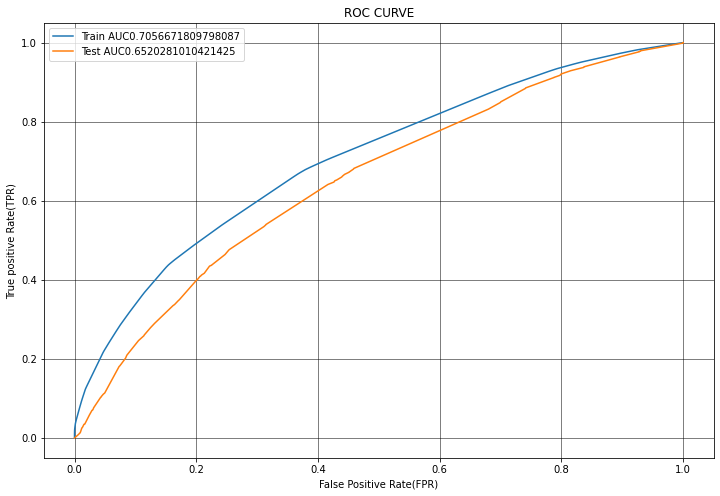

In [49]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_train_set_two, y_train)
y_train_probs = clf.predict_proba(X_train_set_one)[:,1]
y_test_probs= clf.predict_proba(X_test_set_one )[:,1]

train_fpr, train_tpr, tr_thersholds= roc_curve(y_train, y_train_probs)
test_fpr, test_tpr, te_thersholds= roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC"+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC"+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color="black",lw=0.5)

## CONFUSION MATRIX

In [50]:
def find_best_thershold(thershold, fpr, tpr):
    t = thershold[np.argmax(tpr*(1-fpr))]
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for thershold", np.round(t,3))
    return t

def predict_with_best_t(proba, thershold):
    predictions = []
    for i in proba:
        if i>=thershold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

## Train Data 

the maximum value of tpr*(1-fpr) 0.42297762296154395 for thershold 0.509
0.5087441220501006
CONFUSION MATRIX OF TRAIN DATA


[[ 7105  3978]
 [21131 40982]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

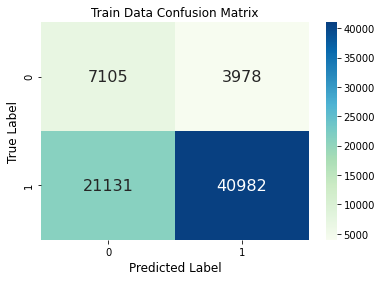

In [51]:
best_t = find_best_thershold(tr_thersholds, train_fpr, train_tpr)
print(best_t)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

### TEST DATA

the maximum value of tpr*(1-fpr) 0.42297762296154395 for thershold 0.509
0.5087441220501006
CONFUSION MATRIX OF TEST DATA


[[ 3186  2273]
 [10970 19623]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

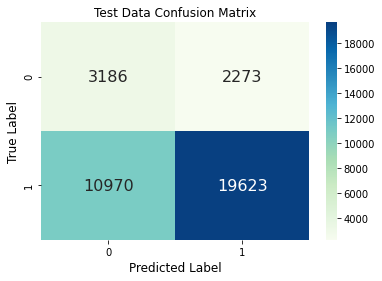

In [53]:
best_t = find_best_thershold(tr_thersholds, train_fpr, train_tpr)
print(best_t)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))

print("CONFUSION MATRIX OF TEST DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

## GETTING ALL THE FALSE POSITIVE DATA POINTS

In [54]:
predict=predict_with_best_t(y_test_probs, best_t)

In [55]:
fpi=[]
for i in range (len(y_test)):
    if(y_test[i]==0)&(predict[i]==1):
        fpi.append(i)
len(fpi)

2273

In [56]:
cols = X_test.columns
X_test_false_Positive=pd.DataFrame(columns=cols)
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)

(2273, 12)


In [57]:
X_test_false_Positive.head(5)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
69487,sc,mrs,grades_3_5,10,literacy_language math_science,literacy mathematics,many students english language learners hard w...,228.89,0.039,0.242,0.719,0.9794
15540,va,ms,grades_3_5,0,specialneeds,specialneeds,my student walking classroom feel safe they al...,108.89,0.031,0.369,0.601,0.9945
103624,nc,mrs,grades_3_5,3,health_sports specialneeds,health_wellness specialneeds,my third grade classroom place students challe...,343.68,0.037,0.367,0.596,0.9961
74506,sc,mrs,grades_prek_2,16,literacy_language,literature_writing,i excited welcome new group first graders the ...,131.16,0.031,0.325,0.644,0.9912
99327,dc,mrs,grades_prek_2,12,literacy_language specialneeds,literature_writing specialneeds,i amazing class first graders i feel privilege...,620.53,0.103,0.196,0.701,0.9622


## WORD CLOUD OF ESSAY TEXT FOR FALSE POSITIVE DATASET

100%|██████████| 2273/2273 [00:00<00:00, 17078.48it/s]


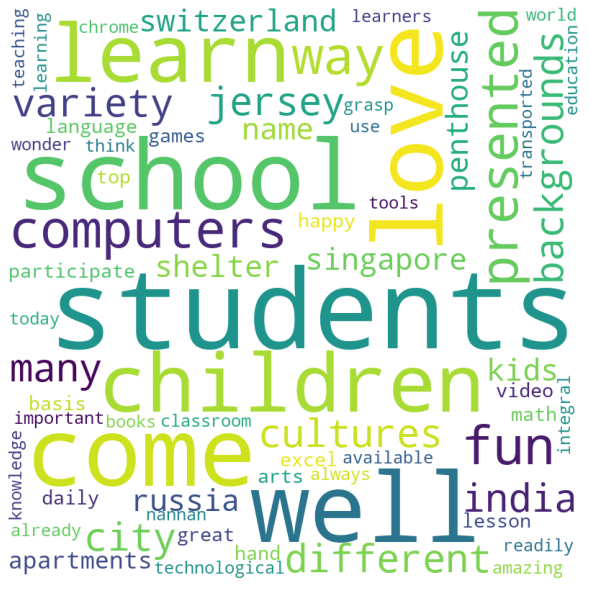

In [58]:
from wordcloud import WordCloud, STOPWORDS
comment_words=''
stopwords=set(STOPWORDS)
for word in tqdm(X_test_false_Positive["essay"]):
    val=str(word)
    tokens=val.split()
    for i in range(len(tokens)):
        tokens[i]=tokens[i].lower()
comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

### BOX PLOT WITH PRICE OF THESE FALSE POSITIVE DATA POINTS

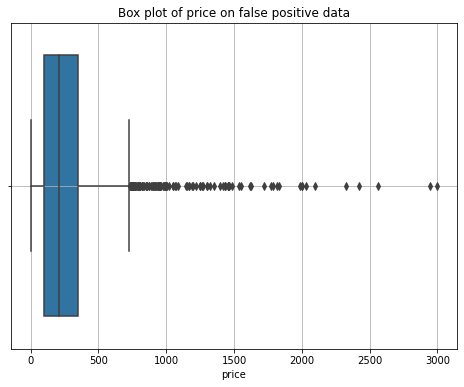

In [62]:
plt.figure(figsize=(8,6))
sns.boxplot("price",data=X_test_false_Positive,orient="v").set_title("Box plot of price on false positive data")
plt.grid()

### PDF PLOT WITHTHE TEACHER _NUMBER_OF_PREVIOUSLY_POSTED_PROJECTS OF THESE FALSE POSITIVE DATA POINTS

[8.74615046e-01 7.12714474e-02 2.72767268e-02 1.09986802e-02
 7.91904971e-03 1.75978883e-03 3.07963044e-03 1.75978883e-03
 4.39947206e-04 8.79894413e-04]
[  0.   24.8  49.6  74.4  99.2 124.  148.8 173.6 198.4 223.2 248. ]


Text(0.5, 0, 'teacher_numebr_of_previously_posted_projects')

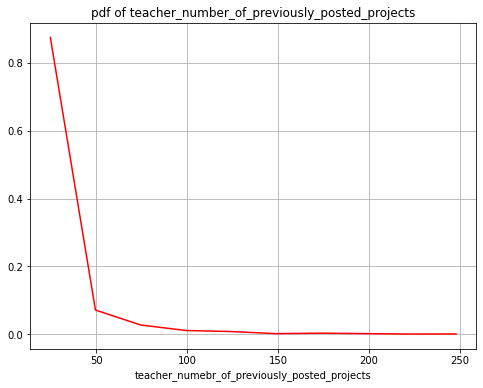

In [63]:
plt.figure(figsize=(8,6))
plt.grid()
counts,bin_edges=np.histogram(X_test_false_Positive["teacher_number_of_previously_posted_projects"],bins=10,density=True)
pdf=counts/(sum(counts))
print(pdf)
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of teacher_number_of_previously_posted_projects")
plt.xlabel("teacher_numebr_of_previously_posted_projects")

# DECISION TREE USING GRID SEARCH CROSS VALIDATION(SET-2)

In [64]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_train_set_two,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'ma

In [65]:
train_auc=clf.cv_results_["mean_train_score"]
train_auc=clf.cv_results_["std_train_score"]
cv_auc=clf.cv_results_["mean_test_score"]
cv_auc_std=clf.cv_results_["std_test_score"]

In [66]:
print("Best score: ",clf.best_score_)
print("Best Hyper Parameters:",clf.best_params_)

Best score:  0.6185345734565398
Best Hyper Parameters: {'max_depth': 5, 'min_samples_split': 500}


### PLOTING HYPERPARAMETER VS AUC

In [67]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [68]:
from itertools import repeat
max_depth=[1,5,10,50]
min_samples_split=[5,10,100,500]

x1=max_depth
y1=min_samples_split
z1=train_auc
z2=cv_auc

In [69]:
trace1=go.Scatter3d(x=x1, y=y1, z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data=[trace1, trace2]

layout =go.Layout(scene= dict(xaxis=dict(title="max_depth"),
                              yaxis=dict(title="min_samples_split"),
                              zaxis=dict(title="AUC-SCORE")))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

### ROC PLOT OF TRAIN AND TEST DATA

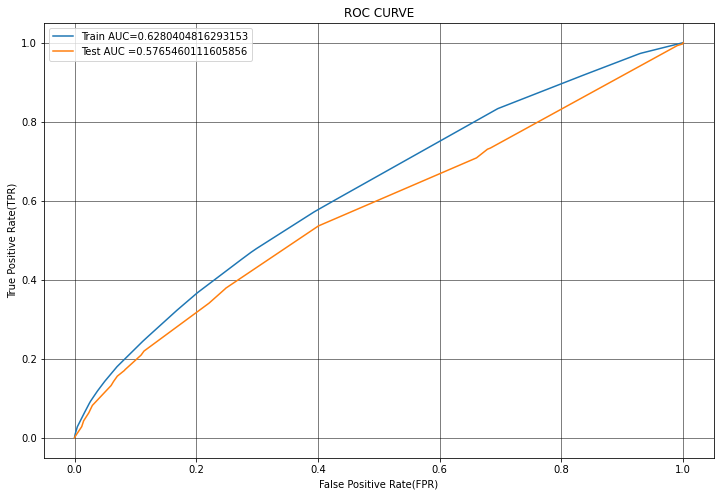

In [70]:
model_set1=DecisionTreeClassifier(class_weight="balanced",max_depth=clf.best_params_["max_depth"],min_samples_split=clf.best_params_["min_samples_split"])
model_set1.fit(X_train_set_two, y_train)
y_train_probs=clf.predict_proba(X_train_set_two)[:,1]
y_test_probs=clf.predict_proba(X_test_set_two)[:,1]

train_fpr, train_tpr, tr_thershold=roc_curve(y_train, y_train_probs)
test_fpr, test_tpr, te_thershold=roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC="+str(auc(train_fpr,train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color="black",lw=0.5)

### CONFUSION MATRIX

In [71]:
def find_best_thershold(thershold, fpr, tpr):
    t = thershold[np.argmax(tpr*(1-fpr))]
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for thershold", np.round(t,3))
    return t

def predict_with_best_t(proba, thershold):
    predictions = []
    for i in proba:
        if i>=thershold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

### TRAIN DATA

the maximum value of tpr*(1-fpr) 0.3468294105323569 for thershold 0.765
CONFUSION MATRIX OF TRAIN DATA


[[11032    51]
 [60347  1766]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

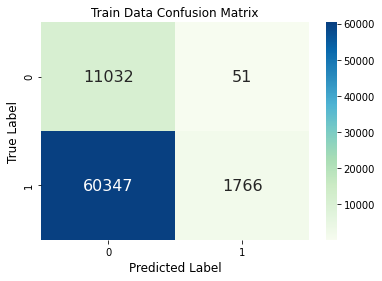

In [72]:
best_t = find_best_thershold(tr_thersholds, train_fpr, train_tpr)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

### TEST DATA

the maximum value of tpr*(1-fpr) 0.3468294105323569 for thershold 0.765
0.7645661722453945
CONFUSION MATRIX OF TEST DATA


[[ 5377    82]
 [29260  1333]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

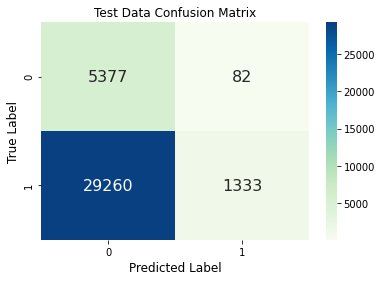

In [73]:
best_t = find_best_thershold(tr_thersholds, train_fpr, train_tpr)
print(best_t)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))

print("CONFUSION MATRIX OF TEST DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### GETTING ALL THE FALSE POSITIVE DATA POINTS

In [74]:
predict=predict_with_best_t(y_test_probs, best_t)

In [75]:
fpi = []
for i in range(len(y_test)):
    if(y_test[i]==0) & (predict[i] == 1):
        fpi.append(i)
len(fpi)

82

In [76]:
cols = X_test.columns
X_test_false_Positive=pd.DataFrame(columns=cols)
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)

(82, 12)


In [77]:
cols = X_test.columns
X_test_false_Positive=pd.DataFrame(columns=cols)
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)

(82, 12)


In [78]:
X_test_false_Positive.head(5)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,neg,pos,neu,compound
35164,wv,mrs,grades_3_5,3,literacy_language,literacy literature_writing,our students spectacular we huge school not st...,9.74,0.027,0.268,0.706,0.9903
102705,fl,mrs,grades_prek_2,34,literacy_language,literacy literature_writing,do remember first time teacher made learning f...,76.57,0.012,0.298,0.690,0.9937
41211,pa,ms,grades_6_8,104,health_sports,health_wellness nutritioneducation,my students energetic academic students love c...,100.46,0.000,0.286,0.714,0.9917
107244,nv,ms,grades_3_5,3,history_civics literacy_language,history_geography literacy,i 28 students different academic levels they l...,5.83,0.031,0.210,0.758,0.9719
52801,ca,ms,grades_9_12,31,literacy_language,literacy,my school located urban low income neighborhoo...,6.79,0.088,0.304,0.608,0.9809


### WORD CLOUD OF ESSAY TEXT FOR FALSE POSITIVE DATASET

100%|██████████| 82/82 [00:00<00:00, 8503.51it/s]


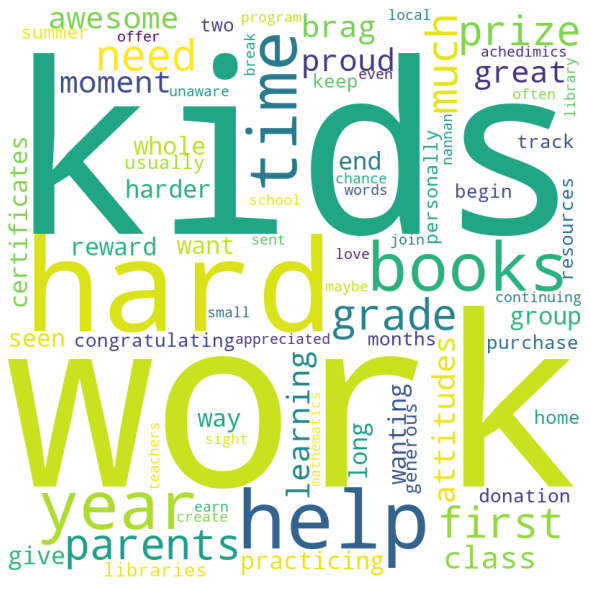

In [79]:
from wordcloud import WordCloud, STOPWORDS
comment_words=''
stopwords=set(STOPWORDS)
for word in tqdm(X_test_false_Positive["essay"]):
    val=str(word)
    tokens=val.split()
    for i in range(len(tokens)):
        tokens[i]=tokens[i].lower()
comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

#### BOX PLOT WITH THE PRICE OF THESE FALSE POSITIVE DATA POINTS

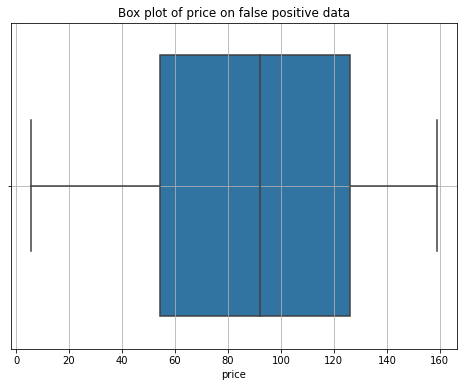

In [80]:
plt.figure(figsize=(8,6))
sns.boxplot("price",data=X_test_false_Positive,orient="v").set_title("Box plot of price on false positive data")
plt.grid()

### PDF PLOT WITH THE TEACHER_NUMBER_OF_PREVIOUSLY_POSTED_PROJECTS OF THESE FALSE POSITIVE DATA POINTS

[0.17073171 0.26829268 0.19512195 0.12195122 0.08536585 0.08536585
 0.02439024 0.03658537 0.         0.01219512]
[  3.   22.8  42.6  62.4  82.2 102.  121.8 141.6 161.4 181.2 201. ]


Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

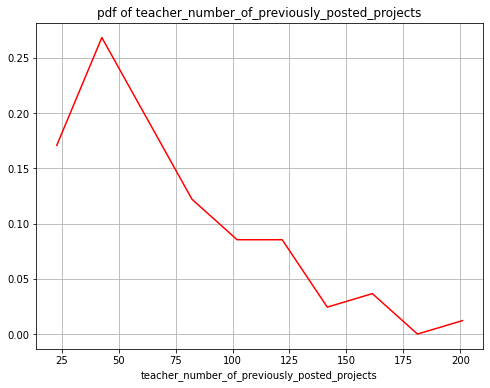

In [81]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges=np.histogram(X_test_false_Positive["teacher_number_of_previously_posted_projects"],bins=10,density=True)
pdf=counts/(sum(counts))
print(pdf)
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of teacher_number_of_previously_posted_projects")
plt.xlabel("teacher_number_of_previously_posted_projects")

# TASK-2

### SELECTING ALL THE FEATURES WHICH ARE HAVING NON-ZERO FEATURES IMPORTANCE(SET -2)

In [82]:
from scipy.sparse import hstack
X_train_set_one=hstack((X_train_essay_tfidf, X_train_school_state_one, X_train_teacher_prefix_one, X_train_project_grade_category_one, X_train_clean_category_one, X_train_clean_subcategory_one, X_train_price_norm, X_train_submission_norm, X_train_neg_norm, X_train_pos_norm, X_train_neu_norm, X_train_compound_norm)).tocsr()
X_test_set_one=hstack((X_test_essay_tfidf, X_test_school_state_one, X_test_teacher_prefix_one, X_test_project_grade_category_one, X_test_clean_category_one, X_test_clean_subcategory_one, X_test_price_norm, X_test_submission_norm, X_test_neg_norm, X_test_pos_norm, X_test_neu_norm, X_test_compound_norm)).tocsr()

In [83]:
print("Shape of train and test After Stacking")
print(X_train_set_one.shape)
print(X_test_set_one.shape)

Shape of train and test After Stacking
(73196, 5105)
(36052, 5105)


In [84]:
clf_fea= DecisionTreeClassifier(class_weight='balanced',max_depth=None,min_samples_split=500)

In [85]:
clf_fea.fit(X_train_set_one,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [86]:
features=clf_fea.feature_importances_
len(features)

5105

In [87]:
non_zero_features=[]
for i in range(len(features)):
    if features[i]>0:
        non_zero_features.append(1)

In [88]:
print("NUMBER OF NON ZERO IMPORTANT FEATURES=", len(non_zero_features))

NUMBER OF NON ZERO IMPORTANT FEATURES= 1064


In [89]:
X_train_fea=X_train_set_one[:,non_zero_features]
X_test_fea=X_test_set_one[:,non_zero_features]

In [90]:
print("SHAPE OF TRAIN AND TEST OF NON ZERO IMPORTANT FEATURES")
print(X_train_fea.shape)
print(X_test_fea.shape)

SHAPE OF TRAIN AND TEST OF NON ZERO IMPORTANT FEATURES
(73196, 1064)
(36052, 1064)


In [91]:
tree_parameters = {'max_depth': [1, 5, 10, 50], 
                  'min_samples_split': [5, 10, 100, 500]}

decision_tree= DecisionTreeClassifier(class_weight='balanced') 
clf = GridSearchCV(decision_tree, tree_parameters, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=-1)
clf.fit(X_train_fea,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'ma

In [92]:
train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']

In [93]:
print('Best score: ',clf.best_score_)
print('Best Hyper parameters: ',clf.best_params_)

Best score:  0.501082821206671
Best Hyper parameters:  {'max_depth': 50, 'min_samples_split': 5}


### PLOTTING HYPERPARAMETER V/S AUC

In [94]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [95]:
from itertools import repeat
max_depth = [1, 5, 10, 50]
min_samples_split = [5, 10, 100, 500]

x1= max_depth
y1= min_samples_split
z1= train_auc
z2= cv_auc

In [96]:
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name="train_auc")
trace2 = go.Scatter3d(x=x1,y=y1,z=z2, name="cv_auc")
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC SCORE'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

### ROC PLOT OF TRAIN AND TEST DATA

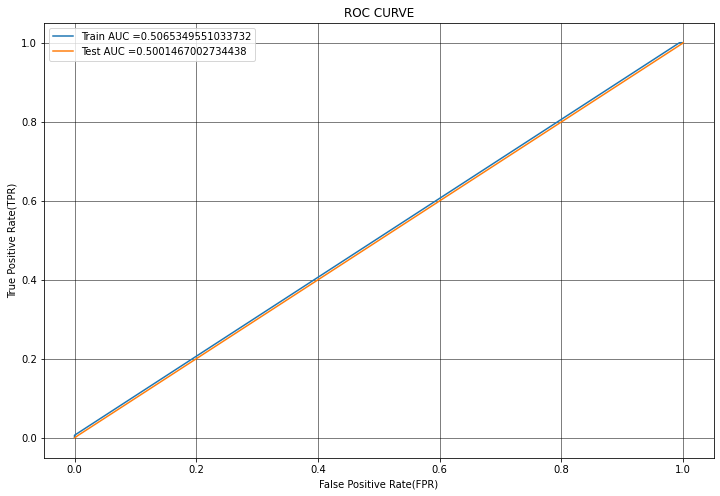

In [97]:
model_set1=DecisionTreeClassifier(class_weight='balanced',max_depth = clf.best_params_["max_depth"],min_samples_split = clf.best_params_["min_samples_split"])
model_set1.fit(X_train_fea,y_train)
y_train_probs = clf.predict_proba(X_train_fea)[:,1] # converting train and test output into probability
y_test_probs= clf.predict_proba(X_test_fea )[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_probs) # storing values of fpr and tpr
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_probs)

plt.figure(figsize=(12,8))
plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("False Positive Rate(FPR)")
plt.ylabel("True Positive Rate(TPR)")
plt.title("ROC CURVE")
plt.grid(color='black',lw=0.5)

### CONFUSION MATRIX

In [98]:
def find_best_thershold(thershold, fpr, tpr):
    t = thershold[np.argmax(tpr*(1-fpr))]
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for thershold", np.round(t,3))
    return t

def predict_with_best_t(proba, thershold):
    predictions = []
    for i in proba:
        if i>=thershold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

### TRAIN DATA

the maximum value of tpr*(1-fpr) 0.007003364835058683 for thershold 1.0
1.0
CONFUSION MATRIX OF TRAIN DATA


[[11083     0]
 [61678   435]]


Text(0.5, 1.0, 'Train Data Confusion Matrix')

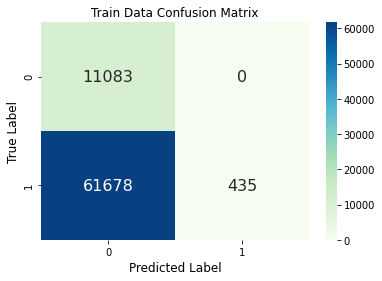

In [99]:
best_t = find_best_thershold(tr_thersholds, train_fpr, train_tpr)
print(best_t)
cm=metrics.confusion_matrix(y_train,predict_with_best_t(y_train_probs, best_t))

print("CONFUSION MATRIX OF TRAIN DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Train Data Confusion Matrix',size=12)

### TEST DATA

the maximum value of tpr*(1-fpr) 0.007003364835058683 for thershold 1.0
1.0
CONFUSION MATRIX OF TEST DATA


[[ 5429    30]
 [30400   193]]


Text(0.5, 1.0, 'Test Data Confusion Matrix')

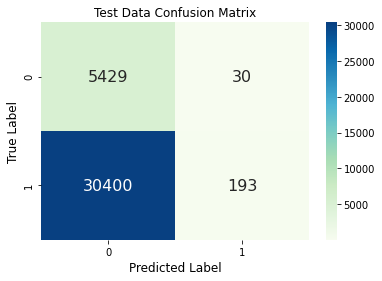

In [100]:
best_t = find_best_thershold(tr_thersholds, train_fpr, train_tpr)
print(best_t)
cm=metrics.confusion_matrix(y_test,predict_with_best_t(y_test_probs, best_t))

print("CONFUSION MATRIX OF TEST DATA")
print("\n")
print(cm)
sns.heatmap(cm, annot=True, fmt='d',cmap='GnBu',annot_kws = {"size":16})
plt.ylabel('True Label',size=12)
plt.xlabel('Predicted Label',size=12)
plt.title('Test Data Confusion Matrix',size=12)

### GETTING ALL THE FALSE POSITIVE DATA POINTS

In [101]:
predict=predict_with_best_t(y_test_probs, best_t)

In [102]:
fpi=[]
for i in range (len(y_test)):
    if(y_test[i]==0)&(predict[i]==1):
        fpi.append(i)
len(fpi)

30

In [103]:
cols = X_test.columns
X_test_false_Positive=pd.DataFrame(columns=cols)
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)

(30, 12)


In [104]:
cols = X_test.columns
X_test_false_Positive=pd.DataFrame(columns=cols)
X_test_false_Positive=X_test.iloc[fpi]    
print(X_test_false_Positive.shape)

(30, 12)


### wordcloud Of Essay Text For False Positive Dataset

100%|██████████| 30/30 [00:00<00:00, 7813.05it/s]


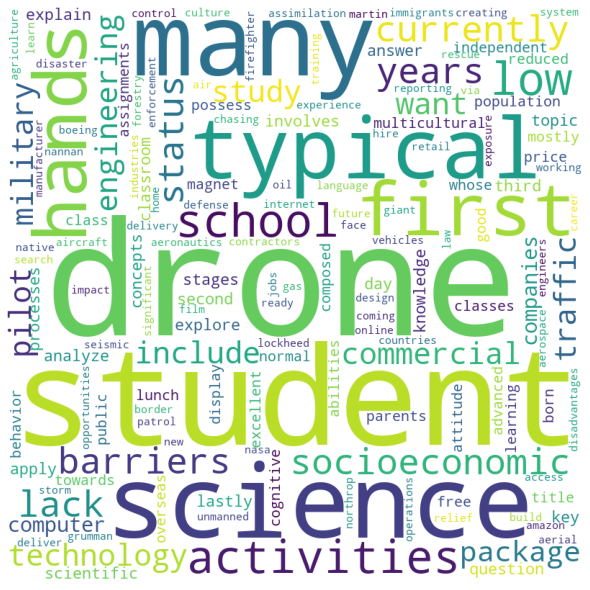

In [105]:
from wordcloud import WordCloud, STOPWORDS
comment_words=''
stopwords=set(STOPWORDS)
for word in tqdm(X_test_false_Positive["essay"]):
    val=str(word)
    tokens=val.split()
    for i in range(len(tokens)):
        tokens[i]=tokens[i].lower()
comment_words += " ".join(tokens)+" "
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords, min_font_size = 10).generate(comment_words)

plt.figure(figsize=(8,8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

#### BOX PLOT WITH THE PRICE OF THESE FALSE POSITIVE DATA POINTS

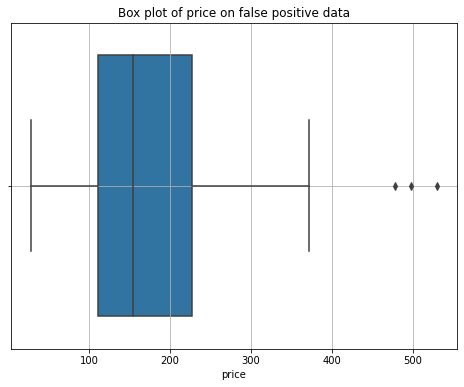

In [106]:
plt.figure(figsize=(8,6))
sns.boxplot("price",data=X_test_false_Positive,orient="v").set_title("Box plot of price on false positive data")
plt.grid()

### PDF PLOT WITH THE TEACHER_NUMBER_OF_PREVIOUSLY_POSTED_PROJECTS OF THESE FALSE POSITIVE DATA POINTS

[0.86666667 0.03333333 0.03333333 0.         0.         0.
 0.         0.         0.03333333 0.03333333]
[ 0.   8.3 16.6 24.9 33.2 41.5 49.8 58.1 66.4 74.7 83. ]


Text(0.5, 0, 'teacher_number_of_previously_posted_projects')

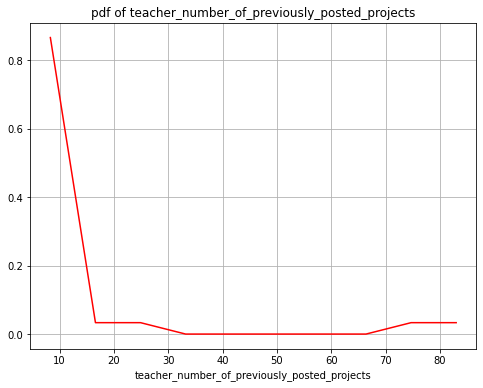

In [107]:
plt.figure(figsize=(8,6))
plt.grid()
counts, bin_edges=np.histogram(X_test_false_Positive["teacher_number_of_previously_posted_projects"],bins=10,density=True)
pdf=counts/(sum(counts))
print(pdf)
print(bin_edges)
plt.plot(bin_edges[1:],pdf,color="red")
plt.title("pdf of teacher_number_of_previously_posted_projects")
plt.xlabel("teacher_number_of_previously_posted_projects")

# SUMMARY

In [108]:
from prettytable import PrettyTable
from prettytable import ALL as ALL
table=PrettyTable(hrules=ALL)
table.field_names = [ "Sl.N0","Vectorizer", "Model", "Hyper Parameter", "Test-AUC"]
table.add_row([1,"TFIDF", "DECSION TREE", "max_depth =10 , min_samples_split=500", 0.65042])
table.add_row([2,"TFIDF W2V", "DECSION TREE"," max_depth =5 , min_samples_split=500", 0.56212])
table.add_row([3,"TFIDF NON ZERO FEATURE IMPORTANCE", "DECSION TREE", "max_depth =10 , min_samples_split=500", 0.650380])
print(table)

+-------+-----------------------------------+--------------+---------------------------------------+----------+
| Sl.N0 |             Vectorizer            |    Model     |            Hyper Parameter            | Test-AUC |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   1   |               TFIDF               | DECSION TREE | max_depth =10 , min_samples_split=500 | 0.65042  |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   2   |             TFIDF W2V             | DECSION TREE |  max_depth =5 , min_samples_split=500 | 0.56212  |
+-------+-----------------------------------+--------------+---------------------------------------+----------+
|   3   | TFIDF NON ZERO FEATURE IMPORTANCE | DECSION TREE | max_depth =10 , min_samples_split=500 | 0.65038  |
+-------+-----------------------------------+--------------+---------------------------------------+----